In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")


Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/monumentimagenotaugmented/"
x = load(os.path.join(path, 'train/Train_3221.jpg'))
print(x.shape)

(300, 300, 3)


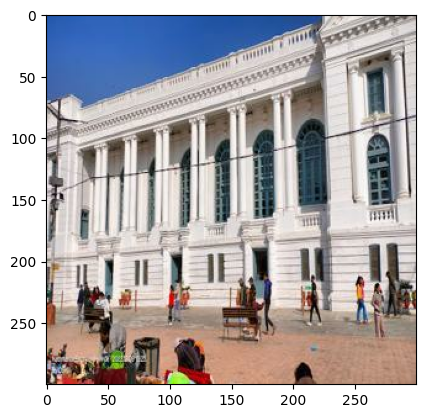

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

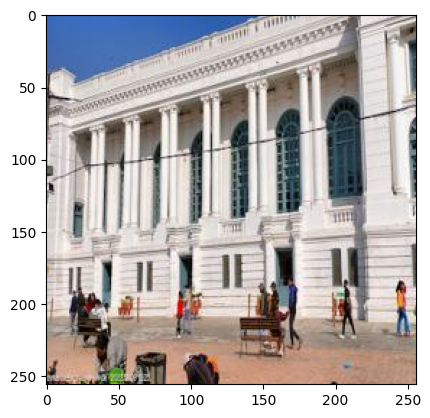

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

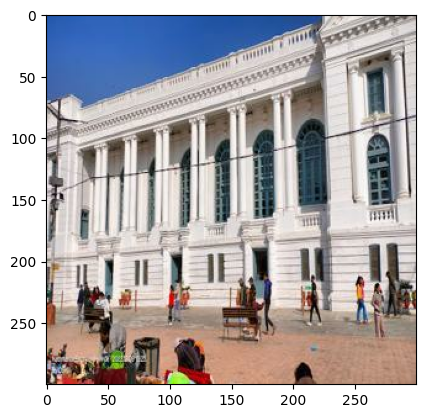

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [16]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [17]:
IMAGE_SIZE = 256
BATCH_SIZE = 32

In [18]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train/*.jpg")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [19]:
test_dataset = tf.data.Dataset.list_files(path + 'val/*.jpg')
test_dataset = test_dataset.map(load_test_image)
test_dataset = test_dataset.batch(BATCH_SIZE)
test_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [20]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 150, 3)


In [21]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 300, 3)


In [22]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True),
        downsample(1024, 4, dropout = True),
        downsample(1024, 4, dropout = True),
        downsample(1024, 4, dropout = True)
    ]


    up_stack = [
        upsample(1024, 4, dropout=True),
        upsample(1024, 4, dropout=True),
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

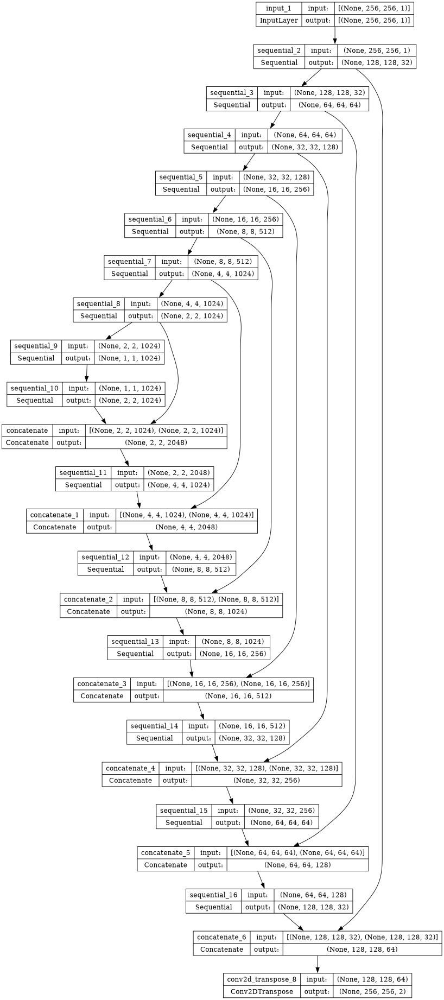

In [23]:
gen = generator()
plot_model(gen, show_shapes=True, dpi = 64)

In [24]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    down1 = downsample(64,4,False)(tar)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = tar, outputs = last)

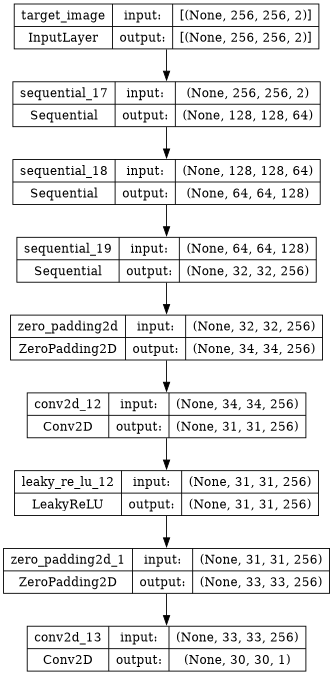

In [25]:
disc = discriminator()
plot_model(disc, show_shapes=True, dpi = 64)

In [26]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [27]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.losses import BinaryCrossentropy, MeanAbsoluteError, MeanSquaredError

# Define generator and discriminator architectures
# Define generator and discriminator models

# Load pre-trained VGG19 model for perceptual loss
vgg_model = VGG19(weights='imagenet', include_top=False)

# Define loss functions
bce_loss = BinaryCrossentropy(from_logits=True)
mae_loss = MeanAbsoluteError()
mse_loss = MeanSquaredError()

80134624/80134624 [==============================] - 0s 0us/step


In [28]:
lambda_adv = 1
lambda_l1 = 150
lambda_l2 = 150
lambda_perceptual = 0.2

In [29]:
def perceptual_loss(y_true, y_pred):
    y_true = tf.keras.applications.vgg19.preprocess_input(y_true)
    y_pred = tf.keras.applications.vgg19.preprocess_input(y_pred)
    features_true = vgg_model(y_true)
    features_pred = vgg_model(y_pred)
    return mae_loss(features_true, features_pred)


In [30]:
def generator_loss(disc_generated_output, input_image, generated_images, real_images):
    adv_loss = bce_loss(tf.ones_like(disc_generated_output), disc_generated_output)

    # Compute L1 loss
    l1_loss = mae_loss(real_images, generated_images)

    # Compute L2 loss
    l2_loss = mse_loss(real_images, generated_images)

    # Compute perceptual loss
#     perceptual_loss_val = perceptual_loss(create_rgb_image(input_image, real_images), create_rgb_image(input_image,generated_images))

    # Total generator loss
    gen_loss =  lambda_adv * adv_loss + lambda_l1 * l1_loss + lambda_l2 * l2_loss

    return gen_loss, adv_loss, l1_loss, l2_loss, 0

In [31]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [32]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [33]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [34]:
epochs = 200

In [35]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc( target, training=True)
        disc_generated_output = disc(gen_output, training=True)
        gen_total_loss, gen_adv_loss, gen_l1_loss, gen_l2_loss, gen_perceptual_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)

        ssim_values = tf.image.ssim(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
        psnr_values = tf.image.psnr(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
        if epoch > 10:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_adv_loss, gen_l1_loss, gen_l2_loss, gen_perceptual_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values

In [36]:
@tf.function
def test_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc( target)
    disc_generated_output = disc(gen_output)

    gen_total_loss, gen_adv_loss, gen_l1_loss, gen_l2_loss, gen_perceptual_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)

    ssim_values = tf.image.ssim(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
    psnr_values = tf.image.psnr(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_adv_loss, gen_l1_loss, gen_l2_loss, gen_perceptual_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values

In [37]:
os.mkdir('/kaggle/working/gen_output/')

In [38]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))

In [39]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


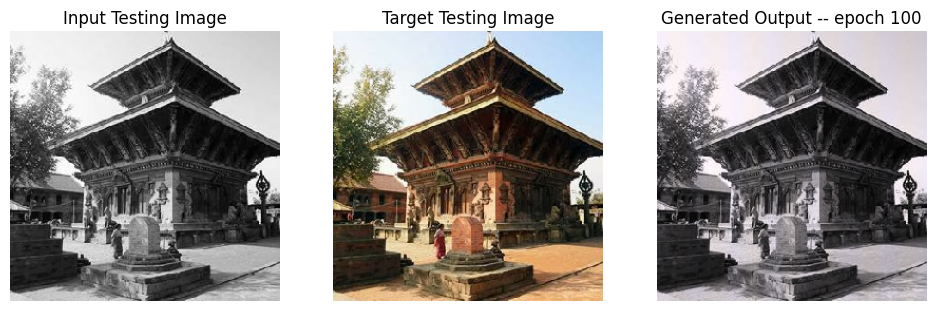

SSIM Score: 0.9275107383728027
PSNR Score: 21.530521392822266


In [40]:
display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/Val_65.jpg',100)

In [41]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
testing_ssim = []
testing_psnr = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate

    for epoch in range(epochs):
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_l2_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_l2_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
            each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            train_count += 1
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.2f} gan_loss:{:.2f} l1_loss:{:.2f} l2_loss:{:.2f} perceptual_loss:{:.2f} Discriminator-- total_loss:{:.2f} real_loss:{:.2f} generated_loss:{:.2f} --- SSIM {:.2f} PSNR {:.2f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_l2_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
        train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss,test_gen_l2_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr = test_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
            each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
        print("Testing Details")
        print("Generator-- total_loss:{:.2f} gan_loss:{:.2f} l1_loss:{:.2f} l2_loss:{:.2f} perceptual_loss:{:.2f} Discriminator-- total_loss:{:.2f} real_loss:{:.2f} generated_loss:{:.2f} --- SSIM {:.2f} PSNR {:.2f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_l2_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
        test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_l2_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_l2_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
        each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
        each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        if epoch == 0 or epoch % 5 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/Val_65.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if epoch > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [42]:
tf.config.run_functions_eagerly(True)

Epoch 0
Training Details
Generator-- total_loss:9.44 gan_loss:1.80 l1_loss:0.05 l2_loss:0.01 perceptual_loss:0.00 Discriminator-- total_loss:1.14 real_loss:0.59 generated_loss:0.55 --- SSIM 0.88 PSNR 22.63
Time taken for epoch 1 is 157.4833950996399 sec
Number of iteration 245
Testing Details
Generator-- total_loss:10.37 gan_loss:1.28 l1_loss:0.05 l2_loss:0.01 perceptual_loss:0.00 Discriminator-- total_loss:1.70 real_loss:0.35 generated_loss:1.36 --- SSIM 0.90 PSNR 22.07
Time taken for epoch 1 is 170.84935879707336 sec
Number of iteration 70
Displaying one random test image...


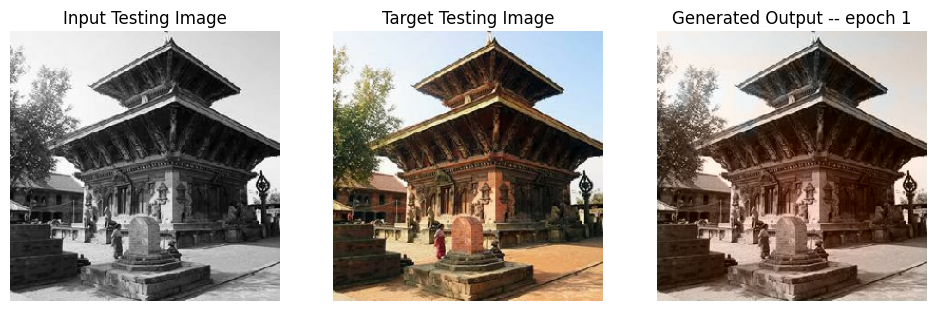

SSIM Score: 0.9252853393554688
PSNR Score: 24.181291580200195
Epoch 1
Training Details
Generator-- total_loss:8.10 gan_loss:1.63 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.12 real_loss:0.54 generated_loss:0.58 --- SSIM 0.92 PSNR 23.81
Time taken for epoch 2 is 155.74256086349487 sec
Number of iteration 245
Testing Details
Generator-- total_loss:8.13 gan_loss:0.94 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.83 real_loss:0.61 generated_loss:1.22 --- SSIM 0.93 PSNR 23.39
Time taken for epoch 2 is 168.63335061073303 sec
Number of iteration 70
Epoch 2
Training Details
Generator-- total_loss:7.48 gan_loss:1.41 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.23 real_loss:0.61 generated_loss:0.62 --- SSIM 0.93 PSNR 24.09
Time taken for epoch 3 is 151.85086131095886 sec
Number of iteration 245
Testing Details
Generator-- total_loss:25.17 gan_loss:17.57 l1_loss:0.05 l2_loss:0.00 perceptual_loss:0.00 Disc

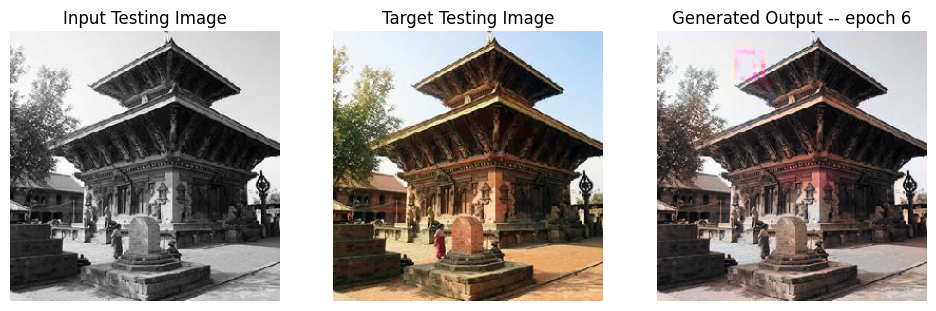

SSIM Score: 0.9457166790962219
PSNR Score: 23.662572860717773
Epoch 6
Training Details
Generator-- total_loss:7.50 gan_loss:1.41 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.13 real_loss:0.55 generated_loss:0.58 --- SSIM 0.93 PSNR 24.05
Time taken for epoch 7 is 151.11282753944397 sec
Number of iteration 245
Testing Details
Generator-- total_loss:16.54 gan_loss:4.05 l1_loss:0.07 l2_loss:0.01 perceptual_loss:0.00 Discriminator-- total_loss:1.01 real_loss:0.08 generated_loss:0.93 --- SSIM 0.88 PSNR 18.88
Time taken for epoch 7 is 163.82115650177002 sec
Number of iteration 70
Epoch 7
Training Details
Generator-- total_loss:7.38 gan_loss:1.30 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.18 real_loss:0.59 generated_loss:0.59 --- SSIM 0.93 PSNR 24.06
Time taken for epoch 8 is 150.82699632644653 sec
Number of iteration 245
Testing Details
Generator-- total_loss:8.77 gan_loss:2.17 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discr

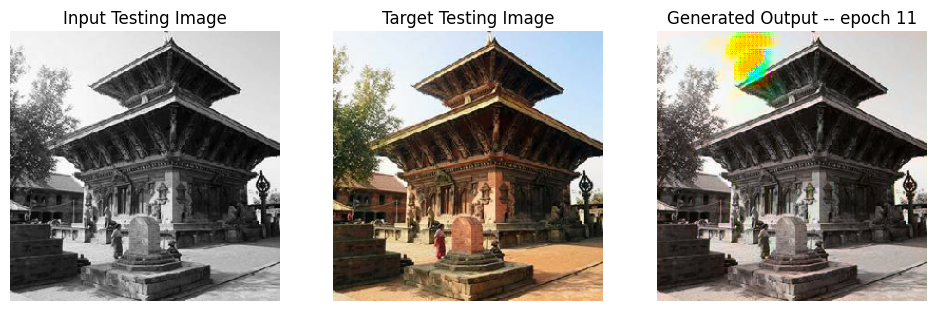

SSIM Score: 0.9071086049079895
PSNR Score: 15.576591491699219
Epoch 11
Training Details
Generator-- total_loss:15.35 gan_loss:8.87 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.01 real_loss:0.01 generated_loss:0.00 --- SSIM 0.91 PSNR 23.40
Time taken for epoch 12 is 104.4721987247467 sec
Number of iteration 245
Testing Details
Generator-- total_loss:15.78 gan_loss:8.49 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.03 real_loss:0.03 generated_loss:3.00 --- SSIM 0.92 PSNR 23.00
Time taken for epoch 12 is 117.0999264717102 sec
Number of iteration 70
Epoch 12
Training Details
Generator-- total_loss:16.70 gan_loss:10.23 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.91 PSNR 23.41
Time taken for epoch 13 is 103.26544070243835 sec
Number of iteration 245
Testing Details
Generator-- total_loss:17.20 gan_loss:9.85 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.0

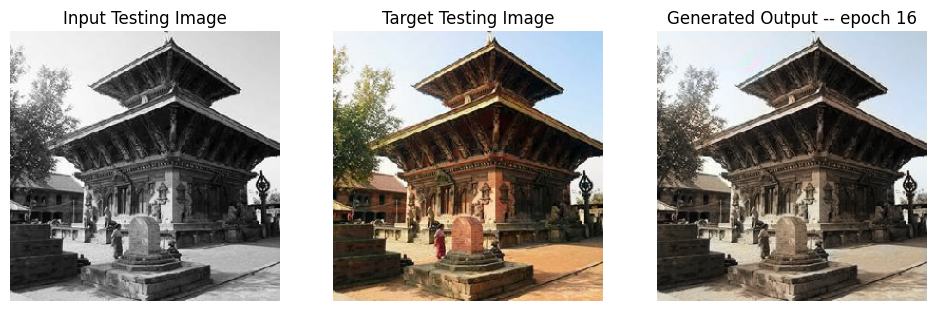

SSIM Score: 0.9658005833625793
PSNR Score: 26.043882369995117
Epoch 16
Training Details
Generator-- total_loss:5.26 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:11.97 real_loss:11.97 generated_loss:0.00 --- SSIM 0.95 PSNR 25.40
Time taken for epoch 17 is 99.24321365356445 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.95 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.58 real_loss:12.52 generated_loss:0.06 --- SSIM 0.95 PSNR 24.83
Time taken for epoch 17 is 111.83164501190186 sec
Number of iteration 70
Epoch 17
Training Details
Generator-- total_loss:5.19 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.48 real_loss:12.48 generated_loss:0.00 --- SSIM 0.95 PSNR 25.53
Time taken for epoch 18 is 99.54077696800232 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.09 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.

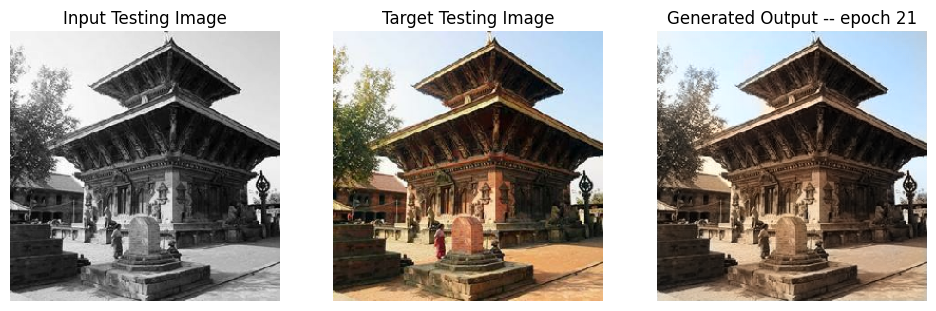

SSIM Score: 0.9765210151672363
PSNR Score: 28.51442527770996
Epoch 21
Training Details
Generator-- total_loss:5.04 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.91 real_loss:12.91 generated_loss:0.00 --- SSIM 0.96 PSNR 25.77
Time taken for epoch 22 is 98.92120695114136 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.67 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:14.75 real_loss:14.75 generated_loss:0.00 --- SSIM 0.95 PSNR 23.92
Time taken for epoch 22 is 111.41121482849121 sec
Number of iteration 70
Epoch 22
Training Details
Generator-- total_loss:5.03 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.87 real_loss:12.87 generated_loss:0.00 --- SSIM 0.96 PSNR 25.79
Time taken for epoch 23 is 99.16822004318237 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.86 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.0

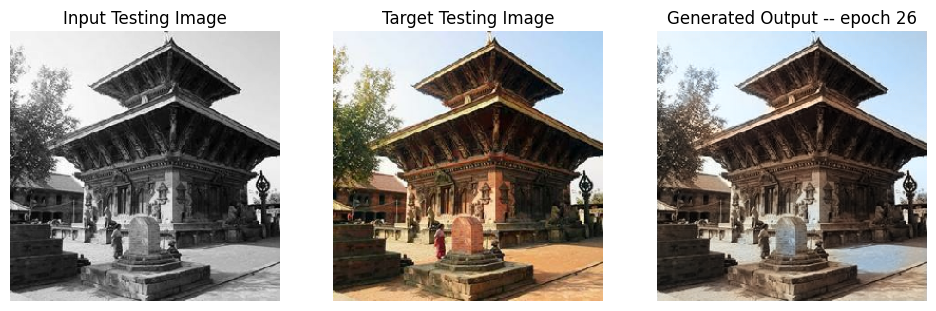

SSIM Score: 0.9716311097145081
PSNR Score: 24.544736862182617
Epoch 26
Training Details
Generator-- total_loss:5.11 gan_loss:0.07 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.85 real_loss:12.85 generated_loss:0.00 --- SSIM 0.96 PSNR 25.78
Time taken for epoch 27 is 99.8748927116394 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.50 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:13.37 real_loss:13.37 generated_loss:0.01 --- SSIM 0.95 PSNR 24.31
Time taken for epoch 27 is 112.55670475959778 sec
Number of iteration 70
Epoch 27
Training Details
Generator-- total_loss:4.95 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.79 real_loss:12.79 generated_loss:0.00 --- SSIM 0.96 PSNR 25.91
Time taken for epoch 28 is 100.17908906936646 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.62 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.

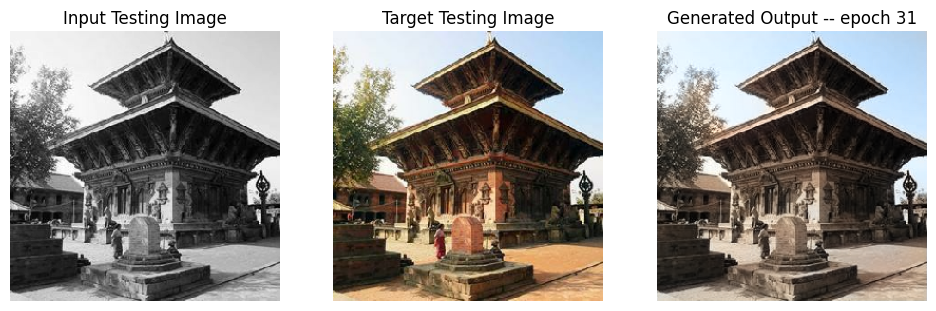

SSIM Score: 0.9750551581382751
PSNR Score: 26.35341453552246
Epoch 31
Training Details
Generator-- total_loss:4.91 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:13.05 real_loss:13.05 generated_loss:0.00 --- SSIM 0.96 PSNR 25.98
Time taken for epoch 32 is 100.30956721305847 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.94 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:14.06 real_loss:14.06 generated_loss:0.00 --- SSIM 0.95 PSNR 23.85
Time taken for epoch 32 is 112.97955584526062 sec
Number of iteration 70
Epoch 32
Training Details
Generator-- total_loss:4.89 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:13.04 real_loss:13.03 generated_loss:0.00 --- SSIM 0.96 PSNR 26.02
Time taken for epoch 33 is 100.13028907775879 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.00 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0

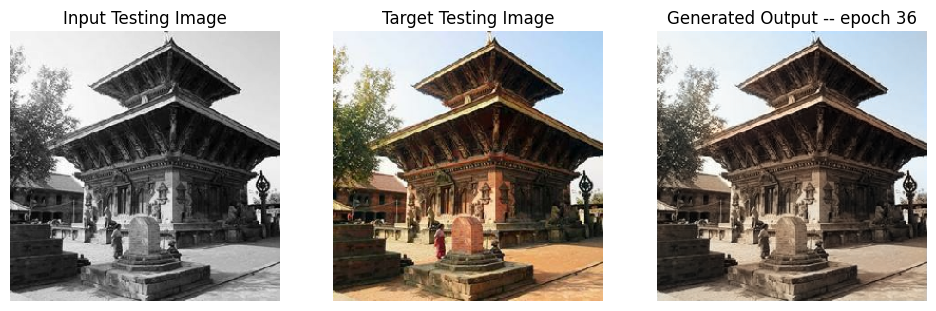

SSIM Score: 0.9765039086341858
PSNR Score: 27.3103084564209
Epoch 36
Training Details
Generator-- total_loss:14.48 gan_loss:9.62 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.05
Time taken for epoch 37 is 103.6309266090393 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.93 gan_loss:0.20 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.79 real_loss:3.76 generated_loss:0.04 --- SSIM 0.96 PSNR 25.12
Time taken for epoch 37 is 116.32382678985596 sec
Number of iteration 70
Epoch 37
Training Details
Generator-- total_loss:15.09 gan_loss:10.22 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.05
Time taken for epoch 38 is 104.19477939605713 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.91 gan_loss:0.17 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 D

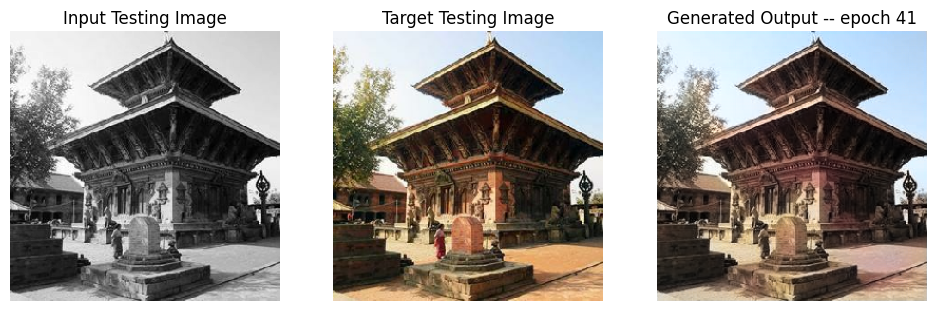

SSIM Score: 0.9737548232078552
PSNR Score: 27.46478271484375
Epoch 41
Training Details
Generator-- total_loss:4.89 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.64 real_loss:6.64 generated_loss:0.00 --- SSIM 0.96 PSNR 25.93
Time taken for epoch 42 is 100.39271306991577 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.90 gan_loss:0.07 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:10.51 real_loss:9.95 generated_loss:0.57 --- SSIM 0.95 PSNR 24.91
Time taken for epoch 42 is 113.05279564857483 sec
Number of iteration 70
Epoch 42
Training Details
Generator-- total_loss:4.90 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.59 real_loss:6.59 generated_loss:0.00 --- SSIM 0.96 PSNR 25.91
Time taken for epoch 43 is 100.4420976638794 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.87 gan_loss:0.02 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Di

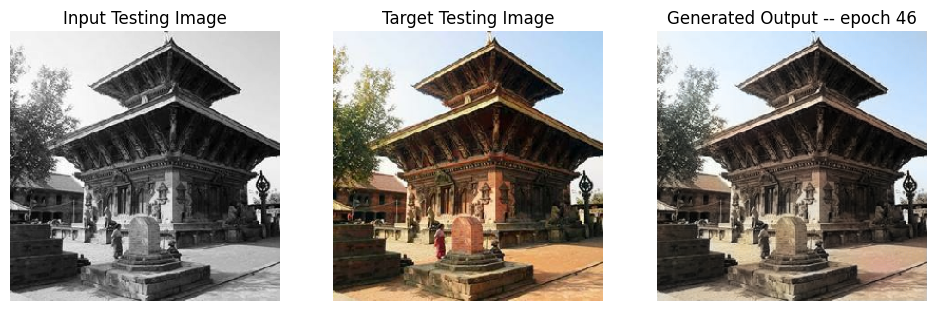

SSIM Score: 0.9721609950065613
PSNR Score: 26.866018295288086
Epoch 46
Training Details
Generator-- total_loss:4.82 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.61 real_loss:6.61 generated_loss:0.00 --- SSIM 0.96 PSNR 26.03
Time taken for epoch 47 is 100.56264066696167 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.14 gan_loss:0.11 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.85 real_loss:6.03 generated_loss:0.82 --- SSIM 0.95 PSNR 24.78
Time taken for epoch 47 is 113.19624495506287 sec
Number of iteration 70
Reduced discriminator learning rate to 9.000000427477062e-05 at epoch 47.
Epoch 47
Training Details
Generator-- total_loss:11.57 gan_loss:6.78 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.06 real_loss:0.04 generated_loss:0.02 --- SSIM 0.96 PSNR 26.02
Time taken for epoch 48 is 103.65726351737976 sec
Number of iteration 245
Testing Details
Generator-- tot

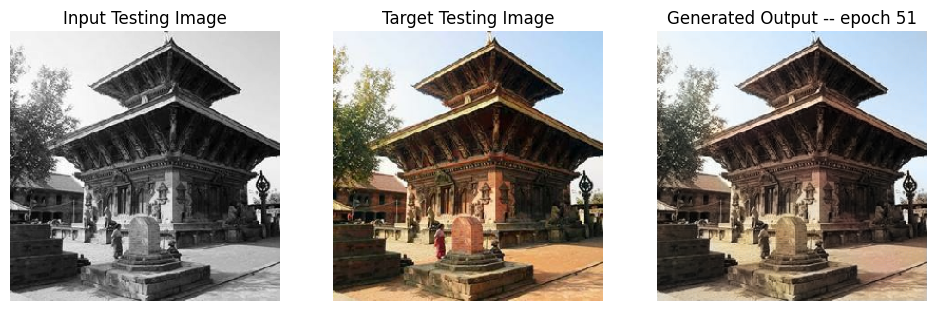

SSIM Score: 0.9753303527832031
PSNR Score: 28.53823471069336
Epoch 51
Training Details
Generator-- total_loss:15.29 gan_loss:10.49 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.03
Time taken for epoch 52 is 103.85397386550903 sec
Number of iteration 245
Testing Details
Generator-- total_loss:10.29 gan_loss:4.63 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.54 real_loss:1.92 generated_loss:0.63 --- SSIM 0.95 PSNR 25.21
Time taken for epoch 52 is 116.70106506347656 sec
Number of iteration 70
Epoch 52
Training Details
Generator-- total_loss:15.63 gan_loss:10.82 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.01
Time taken for epoch 53 is 103.95965814590454 sec
Number of iteration 245
Testing Details
Generator-- total_loss:10.10 gan_loss:4.44 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0

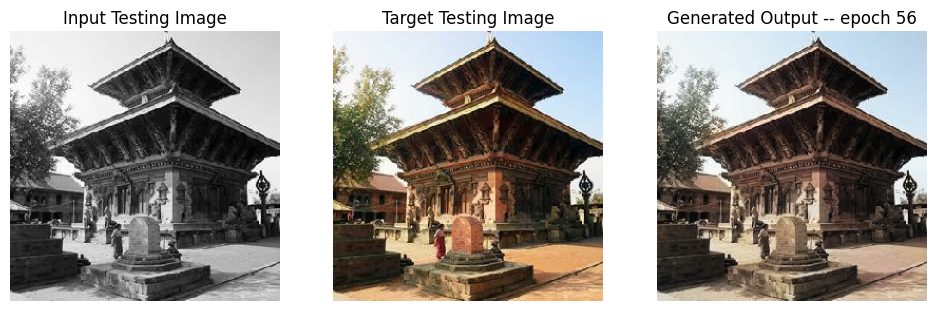

SSIM Score: 0.975189208984375
PSNR Score: 27.66710662841797
Epoch 56
Training Details
Generator-- total_loss:4.83 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.01 real_loss:7.01 generated_loss:0.00 --- SSIM 0.95 PSNR 25.98
Time taken for epoch 57 is 100.68073463439941 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.67 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.25 real_loss:9.18 generated_loss:0.07 --- SSIM 0.95 PSNR 25.21
Time taken for epoch 57 is 113.51810646057129 sec
Number of iteration 70
Epoch 57
Training Details
Generator-- total_loss:4.81 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.99 real_loss:6.99 generated_loss:0.00 --- SSIM 0.95 PSNR 26.03
Time taken for epoch 58 is 101.21297669410706 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.68 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Dis

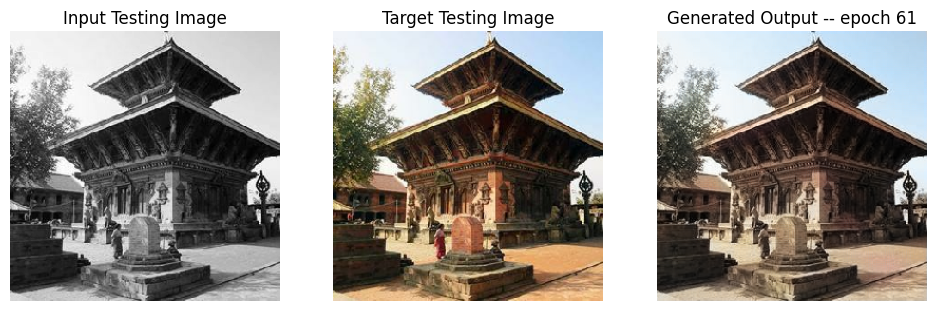

SSIM Score: 0.9744763374328613
PSNR Score: 28.119728088378906
Epoch 61
Training Details
Generator-- total_loss:4.78 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.18 real_loss:7.18 generated_loss:0.00 --- SSIM 0.95 PSNR 26.08
Time taken for epoch 62 is 100.50127220153809 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.97 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:8.83 real_loss:8.78 generated_loss:0.05 --- SSIM 0.95 PSNR 24.84
Time taken for epoch 62 is 113.29684925079346 sec
Number of iteration 70
Reduced discriminator learning rate to 2.700000040931627e-05 at epoch 62.
Epoch 62
Training Details
Generator-- total_loss:12.33 gan_loss:7.61 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.07 real_loss:0.05 generated_loss:0.02 --- SSIM 0.95 PSNR 26.15
Time taken for epoch 63 is 104.42635369300842 sec
Number of iteration 245
Testing Details
Generator-- tot

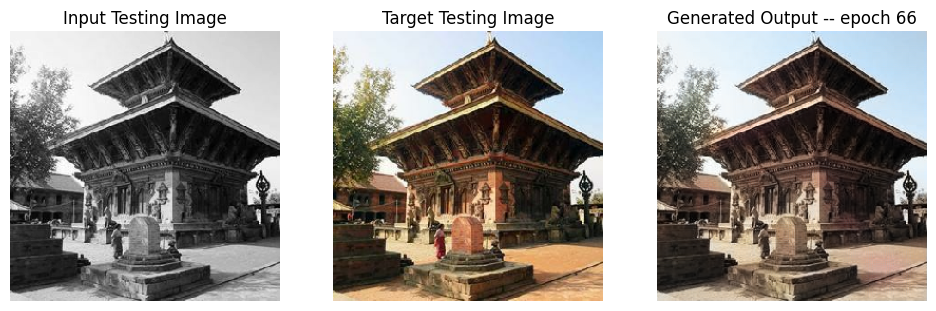

SSIM Score: 0.9737771153450012
PSNR Score: 27.956619262695312
Epoch 66
Training Details
Generator-- total_loss:15.60 gan_loss:10.88 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.95 PSNR 26.15
Time taken for epoch 67 is 103.7313163280487 sec
Number of iteration 245
Testing Details
Generator-- total_loss:8.77 gan_loss:3.11 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.99 real_loss:2.75 generated_loss:0.25 --- SSIM 0.95 PSNR 25.21
Time taken for epoch 67 is 116.66465902328491 sec
Number of iteration 70
Epoch 67
Training Details
Generator-- total_loss:15.85 gan_loss:11.12 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.95 PSNR 26.14
Time taken for epoch 68 is 104.48863458633423 sec
Number of iteration 245
Testing Details
Generator-- total_loss:9.09 gan_loss:3.43 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.0

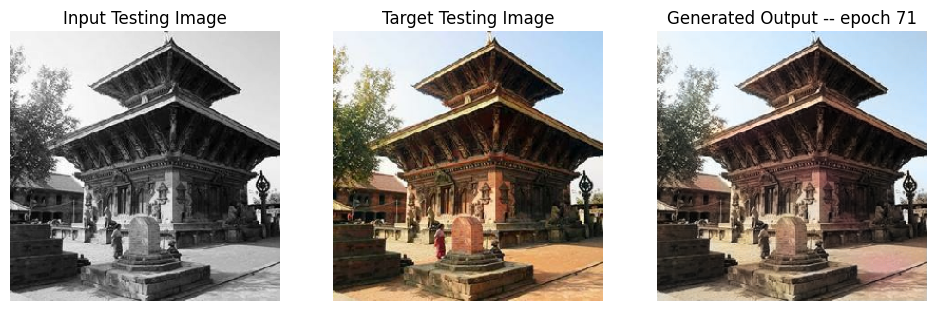

SSIM Score: 0.9751487374305725
PSNR Score: 28.096519470214844
Epoch 71
Training Details
Generator-- total_loss:4.83 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.48 real_loss:6.48 generated_loss:0.00 --- SSIM 0.96 PSNR 25.94
Time taken for epoch 72 is 101.72338891029358 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.71 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.97 real_loss:9.96 generated_loss:0.01 --- SSIM 0.95 PSNR 25.14
Time taken for epoch 72 is 114.56995964050293 sec
Number of iteration 70
Epoch 72
Training Details
Generator-- total_loss:4.81 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.38 real_loss:6.38 generated_loss:0.00 --- SSIM 0.96 PSNR 25.96
Time taken for epoch 73 is 101.0088529586792 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.66 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Di

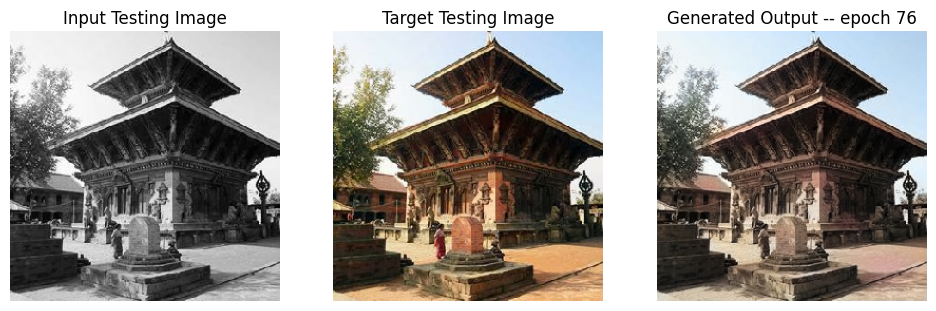

SSIM Score: 0.9737605452537537
PSNR Score: 27.22560691833496
Epoch 76
Training Details
Generator-- total_loss:4.79 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.25 real_loss:6.25 generated_loss:0.00 --- SSIM 0.95 PSNR 26.00
Time taken for epoch 77 is 100.98849749565125 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.70 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:10.12 real_loss:10.11 generated_loss:0.01 --- SSIM 0.95 PSNR 25.11
Time taken for epoch 77 is 113.82028484344482 sec
Number of iteration 70
Reduced discriminator learning rate to 8.100000013655517e-06 at epoch 77.
Epoch 77
Training Details
Generator-- total_loss:10.78 gan_loss:6.05 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.11 real_loss:0.07 generated_loss:0.03 --- SSIM 0.95 PSNR 26.06
Time taken for epoch 78 is 104.33542227745056 sec
Number of iteration 245
Testing Details
Generator-- to

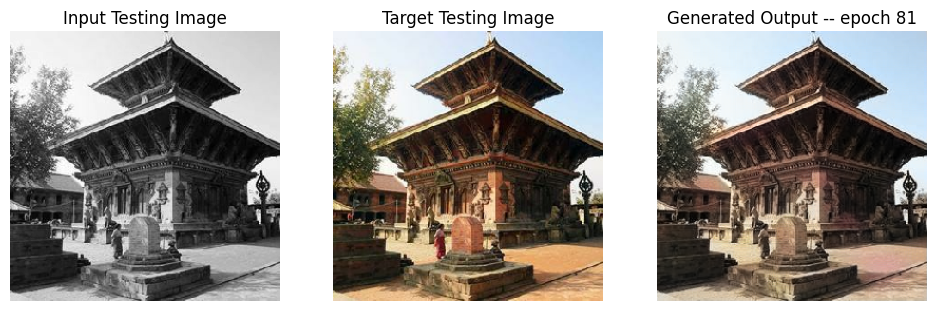

SSIM Score: 0.9747929573059082
PSNR Score: 28.203359603881836
Epoch 81
Training Details
Generator-- total_loss:12.37 gan_loss:7.64 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.01 real_loss:0.01 generated_loss:0.01 --- SSIM 0.95 PSNR 26.08
Time taken for epoch 82 is 105.81452512741089 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.45 gan_loss:0.76 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.68 real_loss:3.58 generated_loss:0.10 --- SSIM 0.95 PSNR 25.14
Time taken for epoch 82 is 119.016197681427 sec
Number of iteration 70
Epoch 82
Training Details
Generator-- total_loss:12.43 gan_loss:7.69 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.02 real_loss:0.01 generated_loss:0.01 --- SSIM 0.95 PSNR 26.06
Time taken for epoch 83 is 105.49068760871887 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.43 gan_loss:0.74 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 D

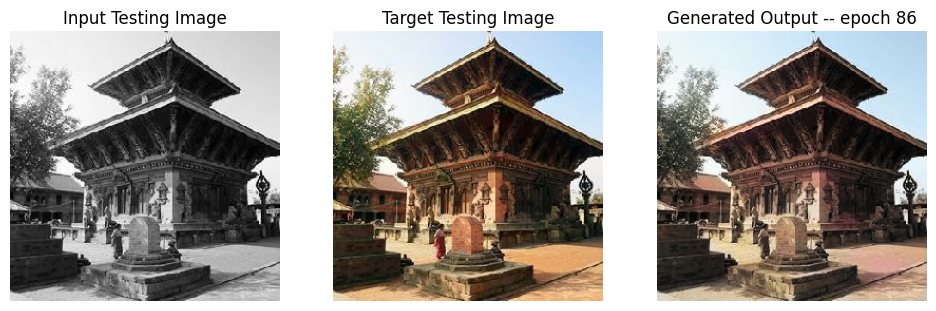

SSIM Score: 0.9729853272438049
PSNR Score: 28.503419876098633
Epoch 86
Training Details
Generator-- total_loss:4.90 gan_loss:0.03 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.30 real_loss:6.30 generated_loss:0.00 --- SSIM 0.95 PSNR 25.80
Time taken for epoch 87 is 102.09702610969543 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.79 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.01 real_loss:8.90 generated_loss:0.11 --- SSIM 0.95 PSNR 25.02
Time taken for epoch 87 is 114.96517038345337 sec
Number of iteration 70
Epoch 87
Training Details
Generator-- total_loss:4.89 gan_loss:0.03 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.45 real_loss:6.44 generated_loss:0.01 --- SSIM 0.95 PSNR 25.82
Time taken for epoch 88 is 101.94329857826233 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.76 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 D

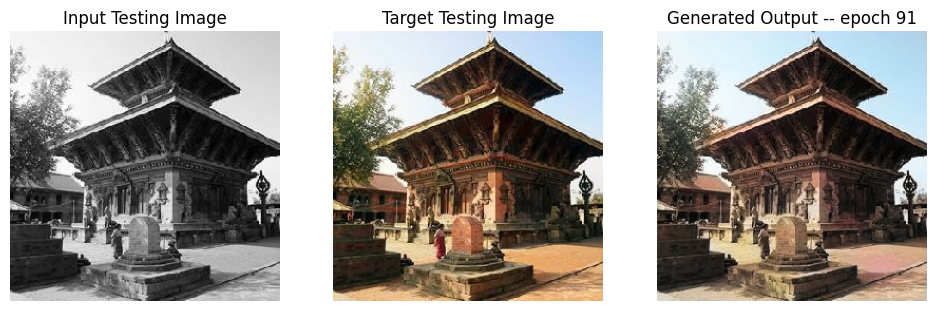

SSIM Score: 0.9701104760169983
PSNR Score: 28.4261474609375
Epoch 91
Training Details
Generator-- total_loss:4.86 gan_loss:0.03 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.63 real_loss:6.62 generated_loss:0.01 --- SSIM 0.95 PSNR 25.86
Time taken for epoch 92 is 101.3300518989563 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.76 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.20 real_loss:9.10 generated_loss:0.09 --- SSIM 0.95 PSNR 25.04
Time taken for epoch 92 is 114.27767968177795 sec
Number of iteration 70
Reduced discriminator learning rate to 2.429999949526973e-06 at epoch 92.
Epoch 92
Training Details
Generator-- total_loss:7.75 gan_loss:2.92 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.80 real_loss:0.42 generated_loss:0.38 --- SSIM 0.95 PSNR 25.85
Time taken for epoch 93 is 105.89958763122559 sec
Number of iteration 245
Testing Details
Generator-- total_l

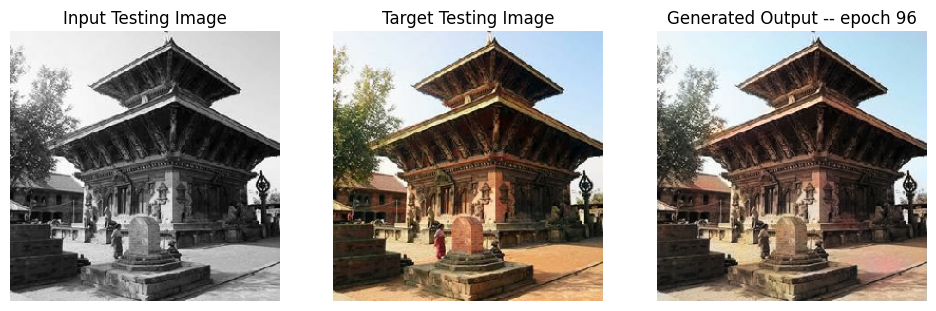

SSIM Score: 0.970729649066925
PSNR Score: 28.517969131469727
Epoch 96
Training Details
Generator-- total_loss:9.28 gan_loss:4.44 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.18 real_loss:0.07 generated_loss:0.10 --- SSIM 0.95 PSNR 25.85
Time taken for epoch 97 is 104.30702757835388 sec
Number of iteration 245
Testing Details
Generator-- total_loss:7.16 gan_loss:1.41 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.03 real_loss:1.62 generated_loss:0.41 --- SSIM 0.95 PSNR 25.03
Time taken for epoch 97 is 117.26849222183228 sec
Number of iteration 70
Epoch 97
Training Details
Generator-- total_loss:9.67 gan_loss:4.83 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.15 real_loss:0.06 generated_loss:0.09 --- SSIM 0.95 PSNR 25.83
Time taken for epoch 98 is 104.45105147361755 sec
Number of iteration 245
Testing Details
Generator-- total_loss:7.39 gan_loss:1.64 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Di

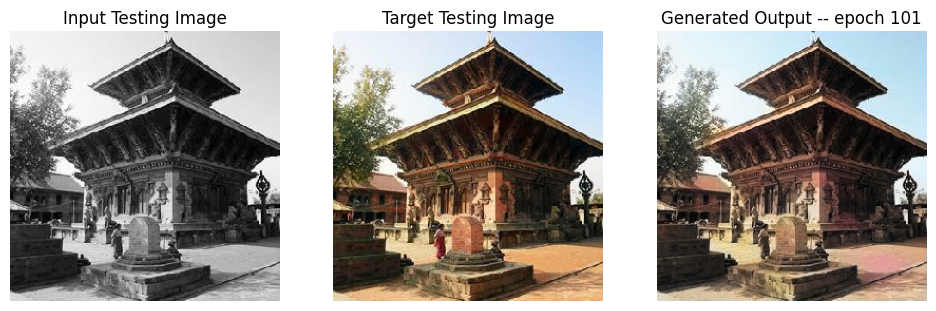

SSIM Score: 0.9692609906196594
PSNR Score: 28.62000846862793
Epoch 101
Training Details
Generator-- total_loss:5.06 gan_loss:0.04 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.68 real_loss:5.63 generated_loss:0.05 --- SSIM 0.95 PSNR 25.47
Time taken for epoch 102 is 102.4664957523346 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.90 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.73 real_loss:7.72 generated_loss:0.01 --- SSIM 0.94 PSNR 24.76
Time taken for epoch 102 is 115.4752151966095 sec
Number of iteration 70
Epoch 102
Training Details
Generator-- total_loss:5.04 gan_loss:0.04 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.57 real_loss:5.52 generated_loss:0.06 --- SSIM 0.95 PSNR 25.50
Time taken for epoch 103 is 102.49672794342041 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.92 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00

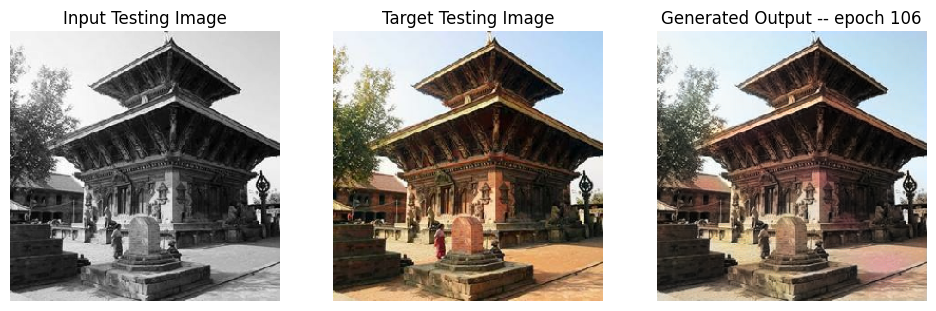

SSIM Score: 0.9700282216072083
PSNR Score: 28.20530891418457
Epoch 106
Training Details
Generator-- total_loss:5.00 gan_loss:0.04 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.64 real_loss:5.59 generated_loss:0.05 --- SSIM 0.95 PSNR 25.57
Time taken for epoch 107 is 102.5719141960144 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.87 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.38 real_loss:7.36 generated_loss:0.02 --- SSIM 0.94 PSNR 24.86
Time taken for epoch 107 is 115.61679697036743 sec
Number of iteration 70
Epoch 107
Training Details
Generator-- total_loss:4.97 gan_loss:0.04 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.61 real_loss:5.53 generated_loss:0.07 --- SSIM 0.95 PSNR 25.60
Time taken for epoch 108 is 102.15621876716614 sec
Number of iteration 245
Testing Details
Generator-- total_loss:5.87 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.0

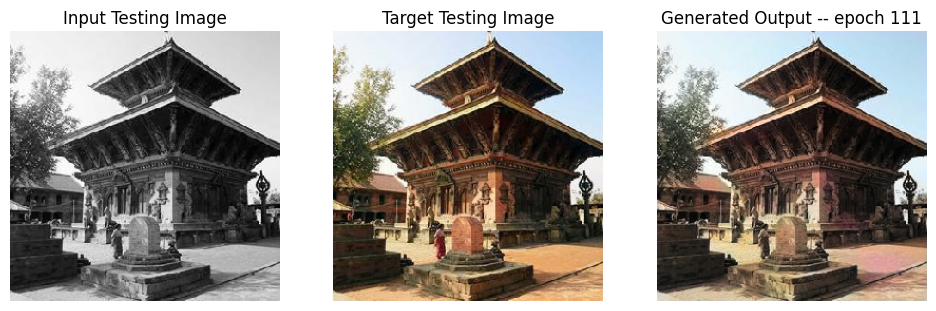

SSIM Score: 0.9692525863647461
PSNR Score: 28.51828384399414
Epoch 111
Training Details
Generator-- total_loss:7.63 gan_loss:2.68 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.85 real_loss:0.29 generated_loss:0.56 --- SSIM 0.95 PSNR 25.60
Time taken for epoch 112 is 105.02544283866882 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.62 gan_loss:0.81 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.54 real_loss:1.03 generated_loss:0.51 --- SSIM 0.94 PSNR 24.90
Time taken for epoch 112 is 117.77392745018005 sec
Number of iteration 70
Epoch 112
Training Details
Generator-- total_loss:7.67 gan_loss:2.73 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.73 real_loss:0.29 generated_loss:0.44 --- SSIM 0.95 PSNR 25.61
Time taken for epoch 113 is 104.75607776641846 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.49 gan_loss:0.68 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.

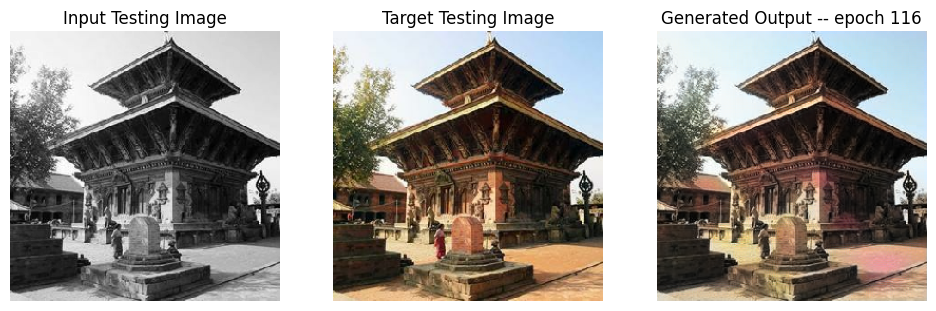

SSIM Score: 0.9661376476287842
PSNR Score: 28.70539665222168
Epoch 116
Training Details
Generator-- total_loss:5.20 gan_loss:0.06 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.24 real_loss:4.82 generated_loss:0.42 --- SSIM 0.94 PSNR 25.25
Time taken for epoch 117 is 101.30696964263916 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.33 gan_loss:0.37 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.63 real_loss:3.43 generated_loss:0.20 --- SSIM 0.94 PSNR 24.65
Time taken for epoch 117 is 114.17791271209717 sec
Number of iteration 70
Epoch 117
Training Details
Generator-- total_loss:5.17 gan_loss:0.05 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.20 real_loss:4.83 generated_loss:0.37 --- SSIM 0.94 PSNR 25.30
Time taken for epoch 118 is 100.798344373703 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.34 gan_loss:0.39 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00

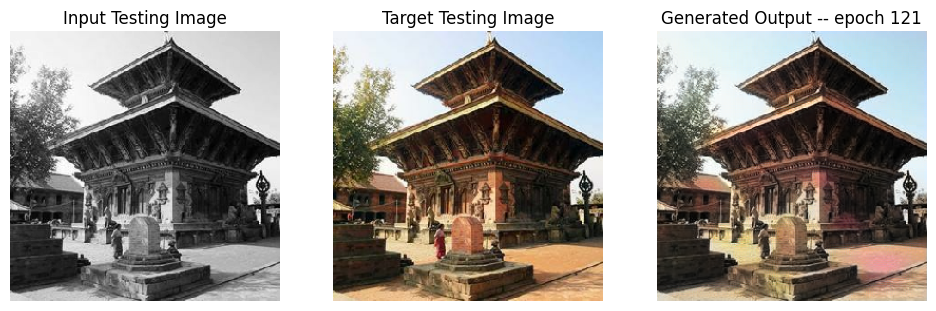

SSIM Score: 0.9641656875610352
PSNR Score: 28.674549102783203
Epoch 121
Training Details
Generator-- total_loss:5.16 gan_loss:0.05 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.22 real_loss:4.75 generated_loss:0.46 --- SSIM 0.94 PSNR 25.31
Time taken for epoch 122 is 102.01104521751404 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.30 gan_loss:0.35 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.67 real_loss:3.43 generated_loss:0.24 --- SSIM 0.94 PSNR 24.71
Time taken for epoch 122 is 114.96410942077637 sec
Number of iteration 70
Reduced discriminator learning rate to 2.1870000637136398e-07 at epoch 122.
Epoch 122
Training Details
Generator-- total_loss:5.27 gan_loss:0.16 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.23 real_loss:3.56 generated_loss:0.67 --- SSIM 0.94 PSNR 25.31
Time taken for epoch 123 is 104.92571806907654 sec
Number of iteration 245
Testing Details
Generator

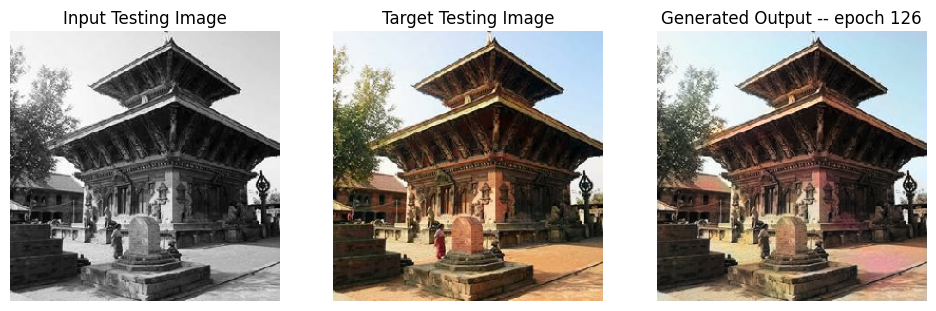

SSIM Score: 0.9636251330375671
PSNR Score: 28.54886817932129
Epoch 126
Training Details
Generator-- total_loss:6.19 gan_loss:1.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.39 real_loss:0.99 generated_loss:1.40 --- SSIM 0.94 PSNR 25.30
Time taken for epoch 127 is 104.88102746009827 sec
Number of iteration 245
Testing Details
Generator-- total_loss:8.14 gan_loss:2.22 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.78 real_loss:0.61 generated_loss:1.17 --- SSIM 0.94 PSNR 24.71
Time taken for epoch 127 is 117.72631525993347 sec
Number of iteration 70
Epoch 127
Training Details
Generator-- total_loss:6.28 gan_loss:1.18 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.32 real_loss:0.88 generated_loss:1.44 --- SSIM 0.94 PSNR 25.32
Time taken for epoch 128 is 104.41843891143799 sec
Number of iteration 245
Testing Details
Generator-- total_loss:8.26 gan_loss:2.33 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.

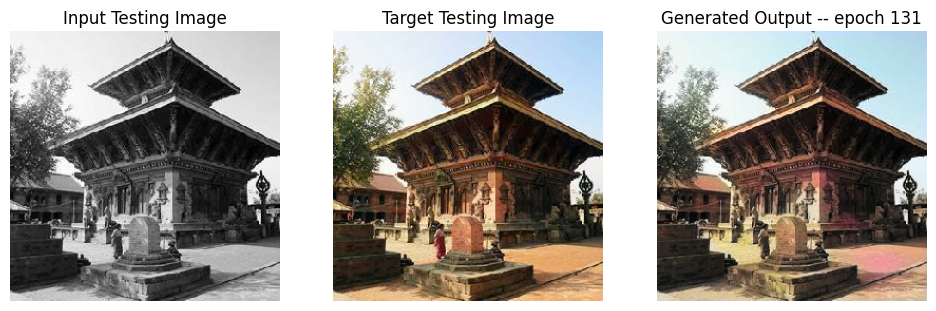

SSIM Score: 0.9600765109062195
PSNR Score: 28.56179428100586
Epoch 131
Training Details
Generator-- total_loss:5.38 gan_loss:0.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.60 real_loss:4.34 generated_loss:1.26 --- SSIM 0.94 PSNR 24.97
Time taken for epoch 132 is 100.9018702507019 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.41 gan_loss:0.35 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.67 real_loss:2.32 generated_loss:0.35 --- SSIM 0.94 PSNR 24.51
Time taken for epoch 132 is 113.84375023841858 sec
Number of iteration 70
Epoch 132
Training Details
Generator-- total_loss:5.36 gan_loss:0.07 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.67 real_loss:4.32 generated_loss:1.34 --- SSIM 0.94 PSNR 25.00
Time taken for epoch 133 is 101.17709612846375 sec
Number of iteration 245
Testing Details
Generator-- total_loss:6.37 gan_loss:0.30 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.0

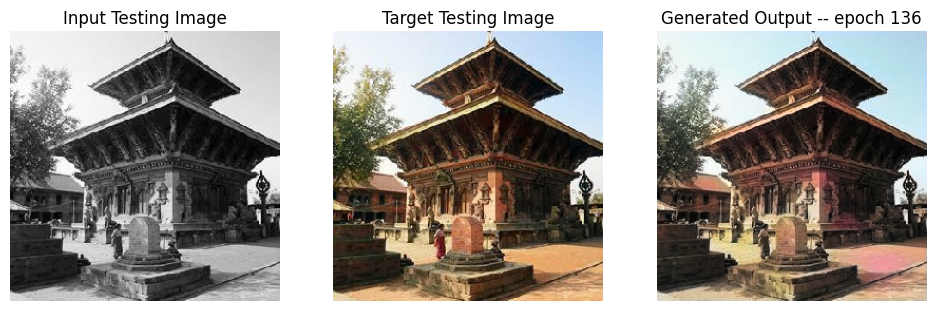

SSIM Score: 0.9584488272666931
PSNR Score: 28.34248924255371
Discriminator learning rate already at the minimum. Stopping training.


In [43]:
fit(train_dataset, epochs, test_dataset, gen)

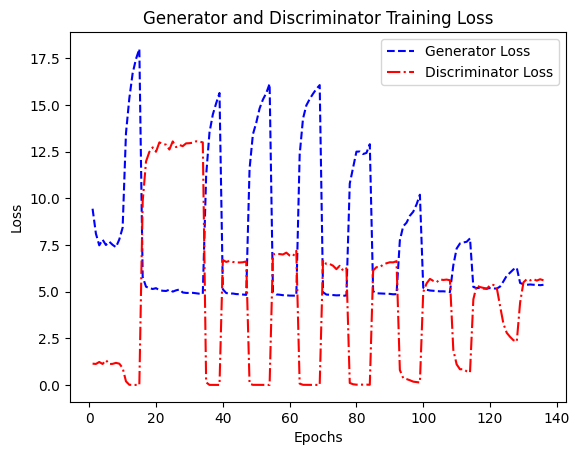

In [44]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

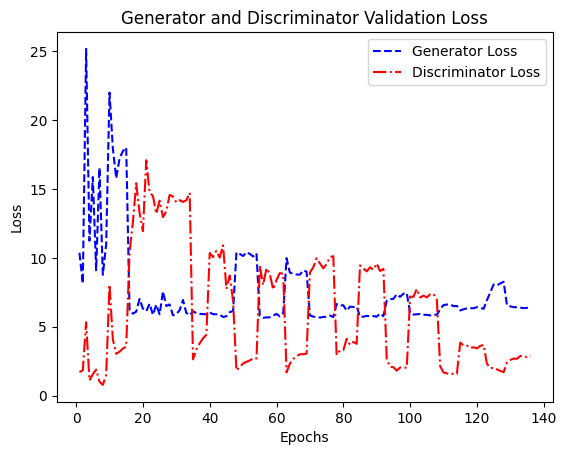

In [45]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

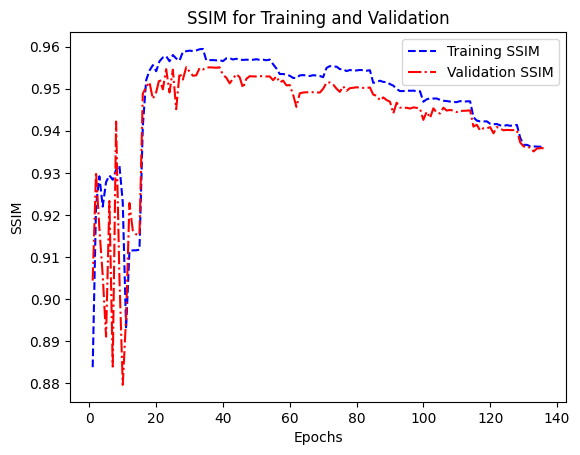

In [46]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.r', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

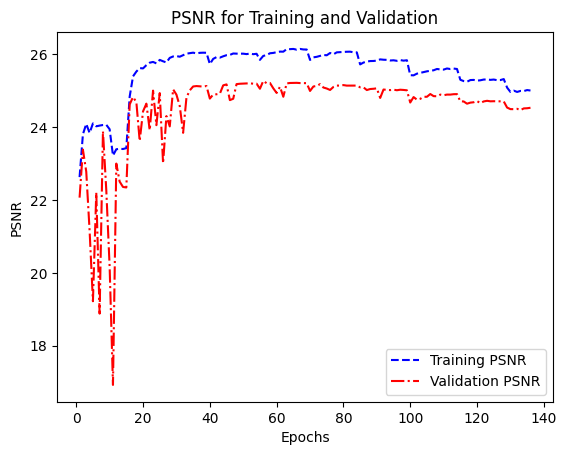

In [47]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.r', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

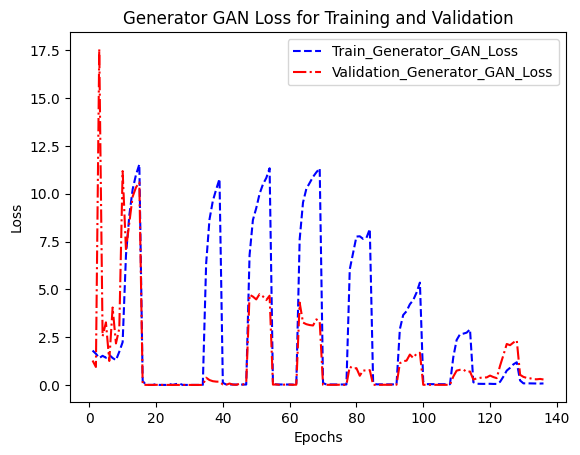

In [48]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses, '-.r', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

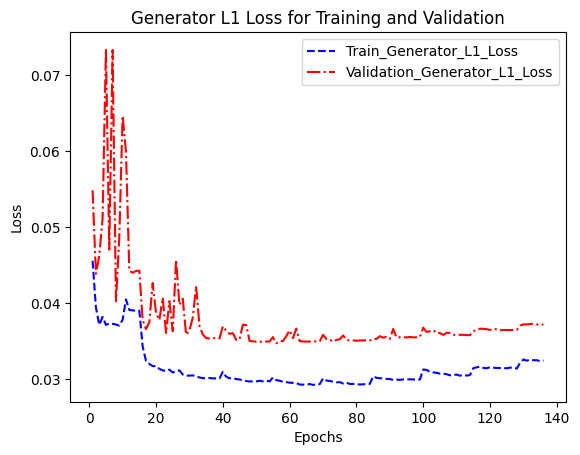

In [49]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.r', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

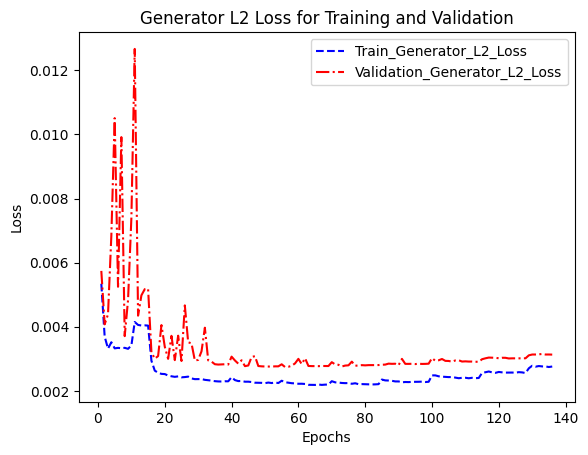

In [50]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l2_losses, '--b', label='Train_Generator_L2_Loss')
plt.plot(epochs, test_generator_l2_losses, '-.r', label='Validation_Generator_L2_Loss')
plt.title('Generator L2 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L2_plot_1.png')
plt.show()

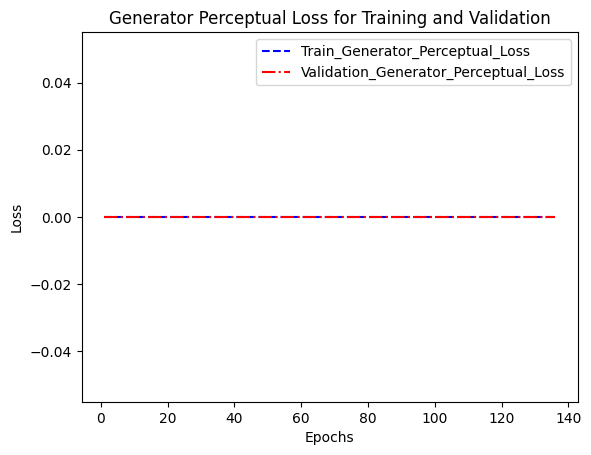

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.r', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

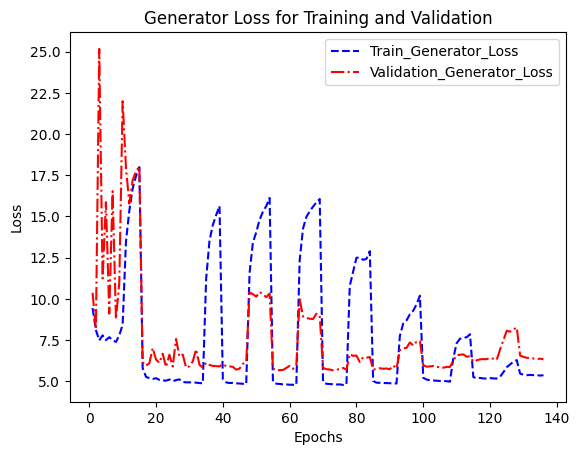

In [52]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.r', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

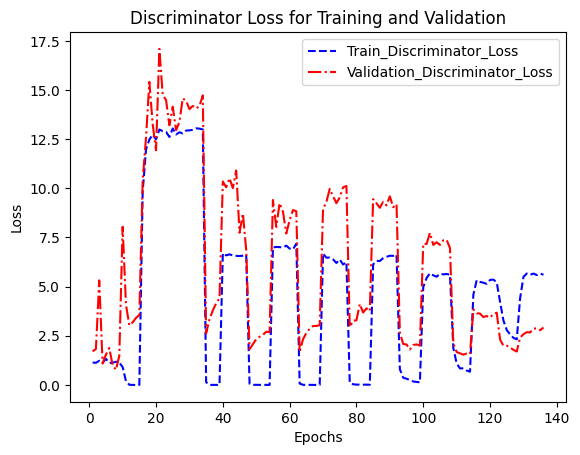

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

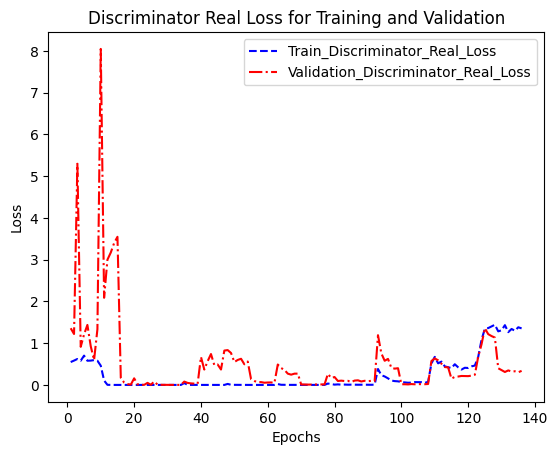

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.r', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

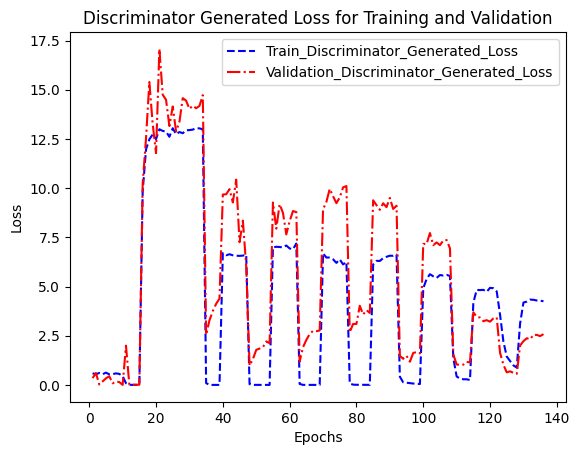

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses, '-.r', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [56]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [57]:
os.mkdir('/kaggle/working/modelsJan20')

In [58]:
gen.save('/kaggle/working/modelsJan20/gen.h5')
gen.save_weights('/kaggle/working/modelsJan20/gen.keras')
disc.save('/kaggle/working/modelsJan20/disc.h5')
disc.save_weights('/kaggle/working/modelsJan20/disc.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [59]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [60]:
import subprocess
from IPython.display import FileLink, display

In [61]:
download_file('/kaggle/working', 'outputJan20')

/kaggle/working/outputJan20.zip